# Satellite Trail Masking Techniques

<div class="alert-danger">Note: The notebook in this repository 'Initializtion.ipynb' goes over many of the basic concepts such as the setup of the environment/package installation and should be read first if you are new to HST images, DrizzlePac, or Astroquery.</div>

## Introduction

Even though Hubble has a small field of view, satellites are commonly captured in images. The cosmic ray rejection algorithm in Astrodrizzle is not well suited to eliminate satellite trails, and the affected adjacent pixels that make up their wings leave ugly blemishes in stacked images. 

To fix this problem, the pixels around satellite trails need to be marked as bad in the affected images. There are several ways to do this. The ACS Team has developed an algorithm to automatically detect and mask satellite trails. This is the easiest and most convenient way. Masks can also be made manually using DS9 regions. While not as convenient, making masks manually allows you to mask not only satellites, but also any other anomalies with odd shapes (e.g. dragon's breath, glint, blooming). 

Both methods are explained below. 

In [1]:
import os
import shutil

from astropy.io import fits
from astroquery.mast import Observations
from astropy.visualization import astropy_mpl_style,LogStretch,ImageNormalize,LinearStretch
from IPython.display import Image
import matplotlib.pyplot as plt
import pyregion

import acstools
from acstools.satdet import detsat, make_mask, update_dq
from drizzlepac.astrodrizzle import AstroDrizzle as adriz

%matplotlib inline

The following tasks in the acstools package can be run with TEAL:
          acs2d                  acs_destripe           acs_destripe_plus     
          acsccd                    acscte              acscteforwardmodel    
          acsrej                    acssum                    calacs
PixCteCorr is no longer supported. Please use acscte.
The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    
The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       imagefindpars           mapreg              photeq       
     pixreplace           pixtopix            pixtosky        refimagefindpars  
     resetbits          runastrodriz          skytopix           tweakback      
      tweakreg           updatenpol


## 1. Dowload the Data

The images to be used are the F814W images of visit B7 from GO program [13498](http://www.stsci.edu/cgi-bin/get-proposal-info?id=13498&observatory=HST). These come from the Hubble Frontier Fields program and are images of the the galaxy cluster MACSJ0717.5+3745. 

There are four dithered exposures in the association to be downloaded.

In [2]:
#Searching for the observsation
results = Observations.query_criteria(obs_id='JC8MB7020', obstype='all')

#Downloading previews and FLC files
jpg_download = Observations.download_products(results['obsid'], mrp_only=False, extension=['jpg'])
flc_download = Observations.download_products(results['obsid'], productSubGroupDescription=['FLC'], mrp_only=False)

 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


In [3]:
# Cleaning up directories after downloading from MAST
for file in jpg_download['Local Path']:
    if 'drc' in file:
        os.rename(file, os.path.basename(file))
        
for file in flc_download['Local Path']:
       os.rename(file, os.path.basename(file))
        
shutil.rmtree('mastDownload')

The image below shows the combined drizzled image from this association. The satellite trail can be seen going across the image from left to right, just above the center of the image. 

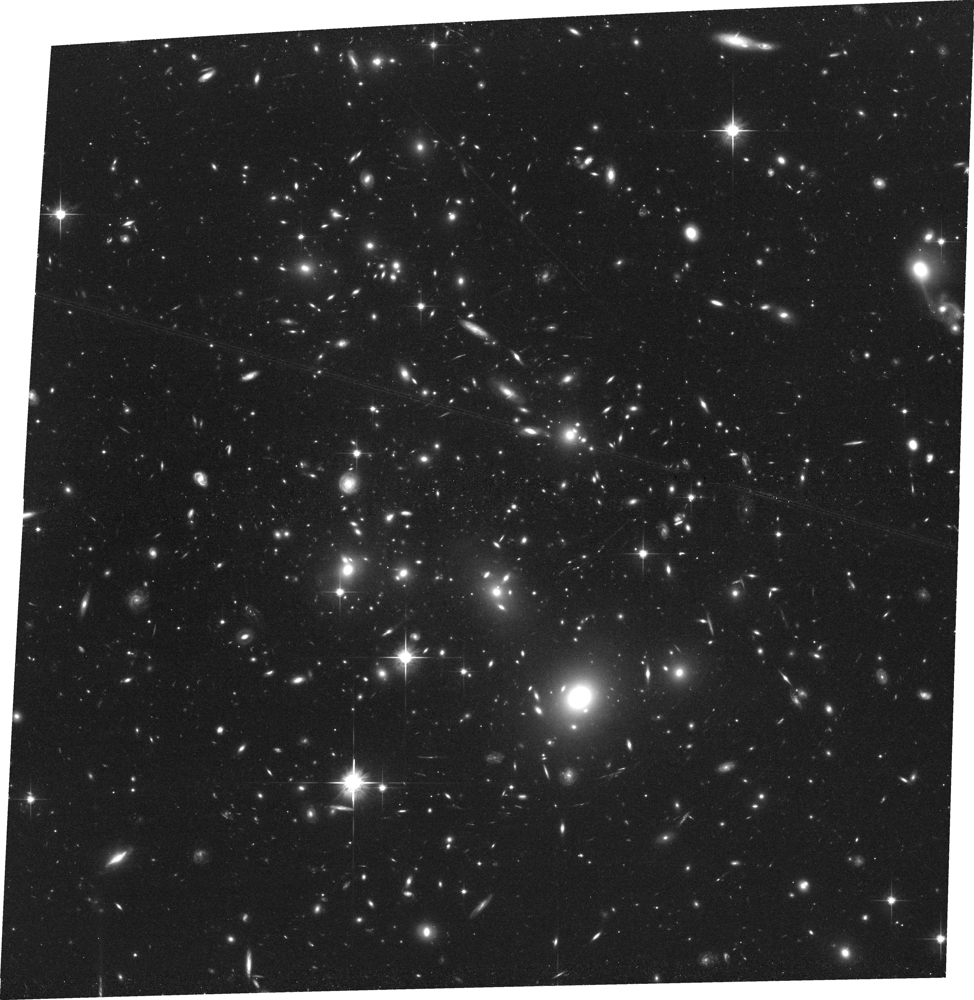

In [4]:
Image(filename='jc8mb7020_drc.jpg')

The bright satellite trail that caused this came from the image *jc8mb7cq_flc.fits*. The figure below shows the top chip which is referred to as SCI,2 (or extension 4). 

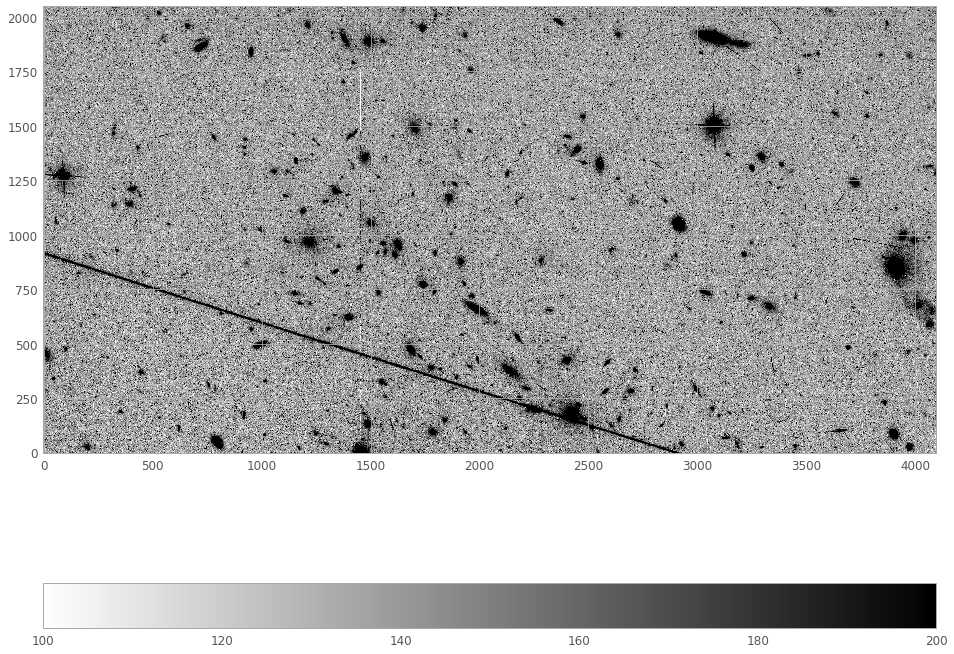

In [5]:
plt.style.use(astropy_mpl_style)
img = fits.getdata('jc8mb7tcq_flc.fits', ext=4)

norm1 = ImageNormalize(img, vmin=100, vmax=200, stretch=LinearStretch())
plt.figure(figsize=(16, 16))
plt.imshow(img, norm=norm1, cmap='gray_r', origin='lower')
plt.colorbar(orientation='horizontal')

## 2. Automated tools for masking satellites

The ACS Team developed an algorithm to automically detect and mask satellite trails in ACS images ([ISR ACS 2016-01](http://www.stsci.edu/hst/acs/documents/isrs/isr1601.pdf)). The module is called `satdet` and can be found in the `acstools` package. The 'readthedocs' page for the software can be found here: [Satellite Trails Detection](https://acstools.readthedocs.io/en/stable/satdet.html). 

The first command below runs the detection algorithm on the top chip only (extension 4) and generates some diagnostic plots. Note that the images are shown upside down from the figure above. 

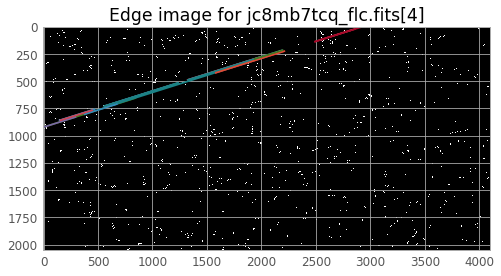

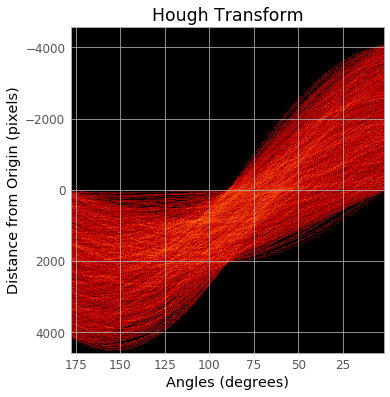

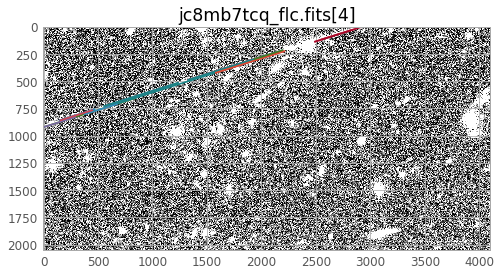

In [6]:
results, errors = detsat('jc8mb7tcq_flc.fits',
                         chips=[4],
                         n_processes=4,
                         plot=True,
                         verbose=False)

The diagnostic plots can be used to verify that the satellite was properly detected. Changing parameters to adjust this task is beyond the scope of this notebook, but please consult the package documentation indicated above for instructions on how to do this. 

Assuming that the satellite trail was properly detected, masks can be made to flag the satellite in the data quality array (DQ) of the image. Once this information is in the DQ array, AstroDrizzle knows to ignore the flagged pixels when making the combined image.  The function `update_dq` is used to flag pixels in the DQ array of SCI,2 (extension 6) using the default flag value of 16384. 

If the satellite were instead on the bottom chip (SCI,1 or extension 1), the `update_dq` function would instead be used to modify extension 3. More detail on the ACS file structure may be found in the [ACS Data Handbook](http://www.stsci.edu/hst/acs/documents/handbooks/currentDHB/acs_Ch23.html).

Rotation: -17.46802325127771


No good profile found for counter=20. Start moving left from starting point.
z=[] is less than 1, subr shape=(150, 200), we are done


Run time: 2.7879340648651123 s
DQ flag value is 16384
Input... flagged NPIX=238195
Existing flagged NPIX=0
Newly... flagged NPIX=238195
jc8mb7tcq_flc.fits[6] updated


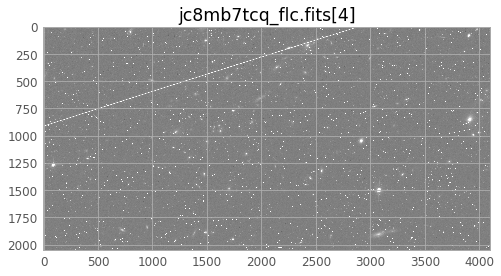

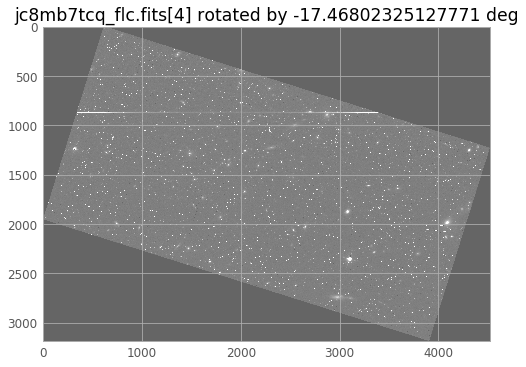

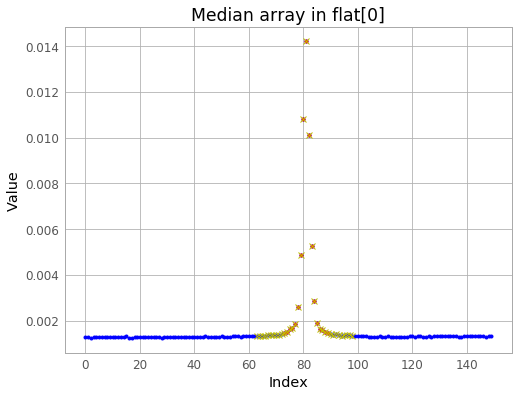

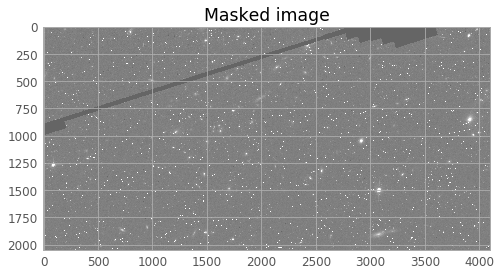

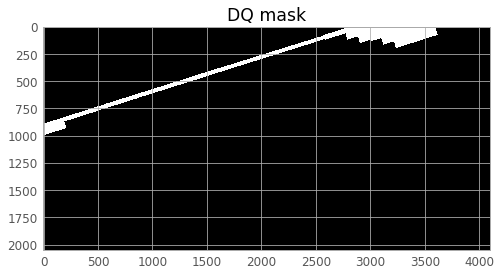

In [7]:
trail_coords = results[('jc8mb7tcq_flc.fits', 4)]
trail_segment = trail_coords[0]
trail_segment
mask = make_mask('jc8mb7tcq_flc.fits', 4, trail_segment, plot=True, verbose=True)
update_dq('jc8mb7tcq_flc.fits', 6, mask, verbose=True)

With the satellite masked, the images can be drizzled again. For brevity, only the top chip (SCI,2) of the image stack will be drizzled together to make a combined product. This is controlled in `AstroDrizzle` via the `group` parameter.

In [8]:
adriz('*flc.fits',
      output='automatic',
      runfile='',
      context=False,
      group='4',
      build=True,
      num_cores=1,
      preserve=False,
      clean=True,
      driz_sep_bits='64,16',
      final_bits='64,16')

No trailer file created...
AstroDrizzle Version 2.2.6 (2018-11-02 15:37:13 -0400) started at: 19:07:34.056 (24/05/2019)

==== Processing Step  Initialization  started at  19:07:34.056 (24/05/2019)


Private attributes "_naxis1" and "_naxis2" have been deprecated since v3.1.
Instead use the "pixel_shape" property which returns a list of NAXISj keyword values.

  warnings.warn(NAXIS_DEPRECATE_MESSAGE, AstropyDeprecationWarning)



Private attributes "_naxis1" and "_naxis2" have been deprecated since v3.1.
Instead use the "pixel_shape" property which returns a list of NAXISj keyword values.

  warnings.warn(NAXIS_DEPRECATE_MESSAGE, AstropyDeprecationWarning)



Private attributes "_naxis1" and "_naxis2" have been deprecated since v3.1.
Instead use the "pixel_shape" property which returns a list of NAXISj keyword values.

  warnings.warn(NAXIS_DEPRECATE_MESSAGE, AstropyDeprecationWarning)



Private attributes "_naxis1" and "_naxis2" have been deprecated since v3.1.
Instead use the "pixel_shape" property which returns a list of NAXISj keyword values.

  warnings.warn(NAXIS_DEPRECATE_MESSAGE, AstropyDeprecationWarning)



WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256
********************************************************************************
*
*  Estimated memory usage:  up to 170 Mb.
*  Output image size:       4122 X 2256 pixels. 
*  Output image file:       ~ 106 Mb. 
*  Cores available:         1
*
********************************************************************************
==== Processing Step  Initialization  finished at  19:07:36.023 (24/05/2019)

==== Processing Step  Static Mask  started at  19:07:36.023 (24/05/2019)


==== Processing Step  Static Mask  finished at  19:07:37.236 (24/05/2019)

==== Processing Step  Subtract Sky  started at  19:07:37.237 (24/05/2019)


***** skymatch started on 2019-05-24 19:07:37.749229
      Version 1.0.2 (2019-03-07 00:54:44 -0500)

'skymatch' task will apply computed sky differences to input image file(s).

NOTE: Computed sky values WILL NOT be subtracted from image data ('subtractsky'=False).
'MDRIZSKY' header keyword will represent sky value *computed* from data.

-----  User specified keywords:  -----
       Sky Value Keyword:  'MDRIZSKY'
       Data Units Keyword: 'BUNIT'


-----  Input file list:  -----

   **  Input image: 'jc8mb7sqq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7sqq_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7sxq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7sxq_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7t5q_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7t5q_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7tcq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7tcq_skymatch_mask_sci2.fits[0]

-----  Sky statistics parameters:  -----
       statistics function: 'median'
       lowe

   *   Image:   'jc8mb7sqq_flc.fits['SCI',2]'  --  SKY = 45.054329015031634 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 133.473   NEW MDRIZSKY = 133.473


   *   Image:   'jc8mb7sxq_flc.fits['SCI',2]'  --  SKY = 44.17128032283559 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 141.9   NEW MDRIZSKY = 141.9


   *   Image:   'jc8mb7t5q_flc.fits['SCI',2]'  --  SKY = 44.576696254863805 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 143.203   NEW MDRIZSKY = 143.203


   *   Image:   'jc8mb7tcq_flc.fits['SCI',2]'  --  SKY = 42.91692948990758 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 137.871   NEW MDRIZSKY = 137.871
***** skymatch ended on 2019-05-24 19:07:39.559103
TOTAL RUN TIME: 0:00:01.809874


==== Processing Step  Subtract Sky  finished at  19:07:39.825 (24/05/2019)

==== Processing Step  Separate Drizzle  started at  19:07:39.825 (24/05/2019)
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256


-Generating simple FITS output: jc8mb7sqq_single_sci.fits
Writing out image to disk: jc8mb7sqq_single_sci.fits
Writing out image to disk: jc8mb7sqq_single_wht.fits


-Generating simple FITS output: jc8mb7sxq_single_sci.fits
Writing out image to disk: jc8mb7sxq_single_sci.fits
Writing out image to disk: jc8mb7sxq_single_wht.fits


-Generating simple FITS output: jc8mb7t5q_single_sci.fits
Writing out image to disk: jc8mb7t5q_single_sci.fits
Writing out image to disk: jc8mb7t5q_single_wht.fits


-Generating simple FITS output: jc8mb7tcq_single_sci.fits
Writing out image to disk: jc8mb7tcq_single_sci.fits
Writing out image to disk: jc8mb7tcq_single_wht.fits
==== Processing Step  Separate Drizzle  finished at  19:07:45.576 (24/05/2019)

==== Processing Step  Create Median  started at  19:07:45.576 (24/05/2019)


reference sky value for image 'jc8mb7sqq_flc.fits' is 133.47344970703125
reference sky value for image 'jc8mb7sxq_flc.fits' is 141.90023803710938


reference sky value for image 'jc8mb7t5q_flc.fits' is 143.20263671875
reference sky value for image 'jc8mb7tcq_flc.fits' is 137.87063598632812


Saving output median image to: 'automatic_med.fits'
==== Processing Step  Create Median  finished at  19:07:53.039 (24/05/2019)

==== Processing Step  Blot  started at  19:07:53.040 (24/05/2019)
    Blot: creating blotted image:  jc8mb7sqq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7sqq_sci2_blt.fits
Writing out image to disk: jc8mb7sqq_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7sxq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7sxq_sci2_blt.fits
Writing out image to disk: jc8mb7sxq_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7t5q_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7t5q_sci2_blt.fits
Writing out image to disk: jc8mb7t5q_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7tcq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7tcq_sci2_blt.fits
Writing out image to disk: jc8mb7tcq_sci2_blt.fits
==== Processing Step  Blot  finished at  19:07:59.691 (24/05/2019)

==== Processing Step  Driz_CR  started at  19:07:59.69 (24/05/2019)


Creating output :  jc8mb7sqq_sci2_crmask.fits


Creating output :  jc8mb7sxq_sci2_crmask.fits


Creating output :  jc8mb7t5q_sci2_crmask.fits


Creating output :  jc8mb7tcq_sci2_crmask.fits
==== Processing Step  Driz_CR  finished at  19:08:09.410 (24/05/2019)

==== Processing Step  Final Drizzle  started at  19:08:09.410 (24/05/2019)
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256


-Generating multi-extension output file:  automatic_drc.fits
Writing out to disk: automatic_drc.fits
==== Processing Step  Final Drizzle  finished at  19:08:22.571 (24/05/2019)


AstroDrizzle Version 2.2.6 is finished processing at 19:08:22.571 (24/05/2019).


   --------------------          --------------------
                   Step          Elapsed time
   --------------------          --------------------

         Initialization          1.9670 sec.
            Static Mask          1.2130 sec.
           Subtract Sky          2.5881 sec.
       Separate Drizzle          5.7509 sec.
          Create Median          7.4632 sec.
                   Blot          6.6511 sec.
                Driz_CR          9.7183 sec.
          Final Drizzle          13.1610 sec.
   ====================          ====================
                  Total          48.5126 sec.


No trailer file saved...


The final drizzled product shows that the bright satellite trail and its wings have been removed. A second, fainter satellite can be seen from a different image in the stack, and this will be masked in the steps below. 

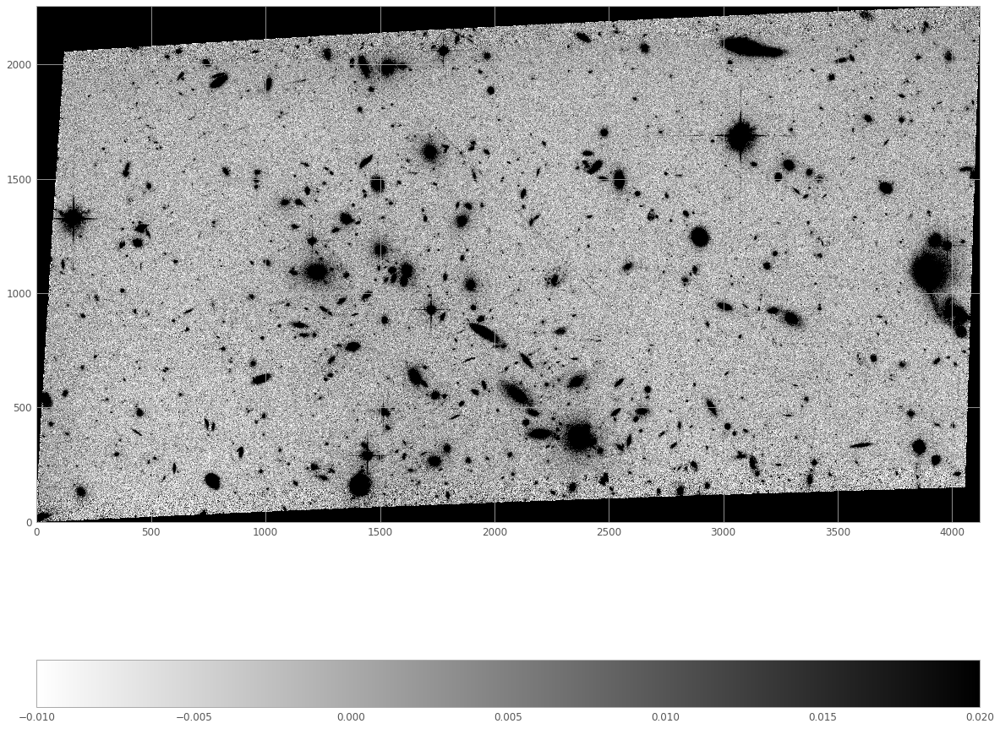

In [9]:
img = fits.getdata('automatic_drc.fits', ext=1)

norm1 = ImageNormalize(img, vmin=-0.01, vmax=0.02, stretch=LinearStretch())
plt.figure(figsize=(20, 20))
plt.imshow(img, norm=norm1, cmap='gray_r', origin='lower')
plt.colorbar(orientation='horizontal')

## 3. Manual masking of satellites and other anomalies

While the automatic detection algorithm flagged and masked the large satellite trail, the image above shows a second trail from a different image in the stack. 

To get rid of this trail, we will demonstrate how a DS9 regions can be used. The example image displayed below shows a region around a satellite trail. 

This region was saved in image coordinates. **NOTE THAT REGIONS SAVED IN SKY COORDINATES WILL NOT WORK FOR THIS EXAMPLE**. Below is the contents of the region file.

```
# Region file format: DS9 version 4.1
global color=green dashlist=8 3 width=1 font="helvetica 10 normal roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1
image
polygon(1476.9255,1816.4415,1545.7465,1818.5921,2825.3869,485.1853,2765.1685,480.88399)
```

The `pyregion` package will be used to make masks out of region files. For details on how to use this package go [here](https://pyregion.readthedocs.io/en/latest/). (*This package will eventually be superseded by the astropy affiliated `regions` package*.)

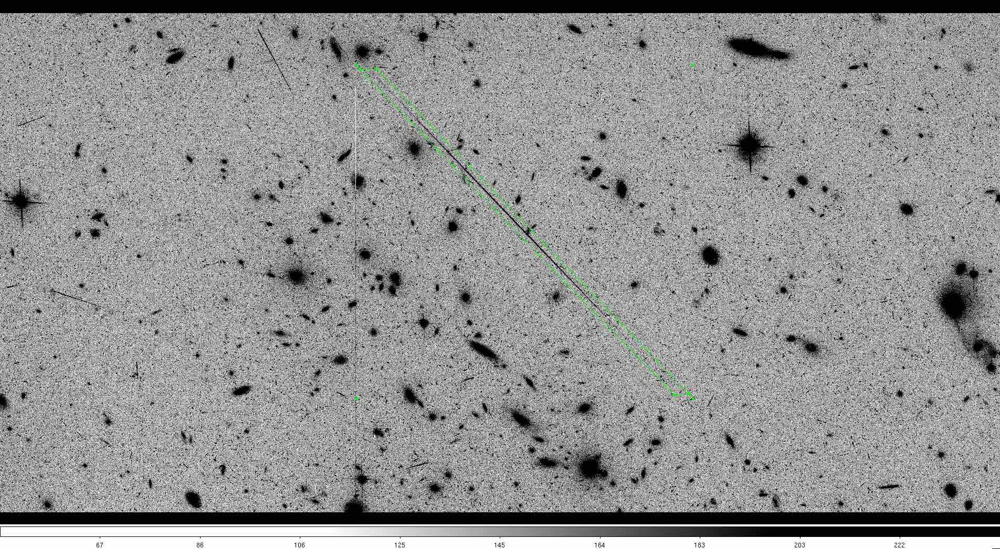

In [10]:
Image(filename='sat.jpeg')

Text(0.5, 1.0, 'DQ array of jc8mb7t5q_flc.fits[6] showing masked pixels')

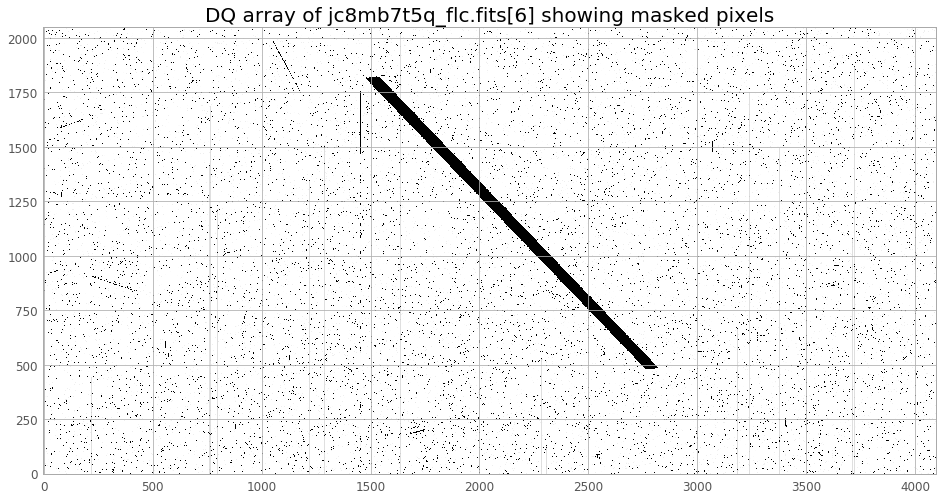

In [11]:
# Reading region file
reg_file = pyregion.parse('''# Region file format: DS9 version 4.1
global color=green dashlist=8 3 width=1 font="helvetica 10 normal roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1
image
polygon(1476.9255,1816.4415,1545.7465,1818.5921,2825.3869,485.1853,2765.1685,480.88399)''')

# Making mask out of region file and masking DQ array
with fits.open('jc8mb7t5q_flc.fits', mode='update') as hdu:

    dq  = hdu[6].data
    mask = reg_file.get_mask(shape=dq.shape)
    dq[mask] |= 16384      
        
norm1 = ImageNormalize(img, vmin=0, vmax=1000, stretch=LinearStretch())
plt.figure(figsize=(16, 10))
plt.imshow(dq, norm=norm1, cmap='gray_r', origin='lower')
plt.title('DQ array of jc8mb7t5q_flc.fits[6] showing masked pixels', fontsize=20)

With the satellite masked, the full set of images can be drizzled once more. 

In [12]:
adriz('*flc.fits',
      output='manual',
      runfile='',
      context=False,
      group='4',
      build=True,
      num_cores=1,
      preserve=False,
      clean=True,
      driz_sep_bits='16, 64',
      final_bits='16, 64')

No trailer file created...
AstroDrizzle Version 2.2.6 (2018-11-02 15:37:13 -0400) started at: 19:08:25.538 (24/05/2019)

==== Processing Step  Initialization  started at  19:08:25.539 (24/05/2019)


WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256
********************************************************************************
*
*  Estimated memory usage:  up to 170 Mb.
*  Output image size:       4122 X 2256 pixels. 
*  Output image file:       ~ 106 Mb. 
*  Cores available:         1
*
********************************************************************************
==== Processing Step  Initialization  finished at  19:08:27.409 (24/05/2019)

==== Processing Step  Static Mask  started at  19:08:27.409 (24/05/2019)


==== Processing Step  Static Mask  finished at  19:08:28.654 (24/05/2019)

==== Processing Step  Subtract Sky  started at  19:08:28.654 (24/05/2019)


***** skymatch started on 2019-05-24 19:08:29.013042
      Version 1.0.2 (2019-03-07 00:54:44 -0500)

'skymatch' task will apply computed sky differences to input image file(s).

NOTE: Computed sky values WILL NOT be subtracted from image data ('subtractsky'=False).
'MDRIZSKY' header keyword will represent sky value *computed* from data.

-----  User specified keywords:  -----
       Sky Value Keyword:  'MDRIZSKY'
       Data Units Keyword: 'BUNIT'


-----  Input file list:  -----

   **  Input image: 'jc8mb7sqq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7sqq_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7sxq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7sxq_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7t5q_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7t5q_skymatch_mask_sci2.fits[0]

   **  Input image: 'jc8mb7tcq_flc.fits'
       EXT: 'SCI',2;	MASK: jc8mb7tcq_skymatch_mask_sci2.fits[0]

-----  Sky statistics parameters:  -----
       statistics function: 'median'
       lowe

   *   Image:   'jc8mb7sqq_flc.fits['SCI',2]'  --  SKY = 45.054329015031634 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 133.473   NEW MDRIZSKY = 133.473


   *   Image:   'jc8mb7sxq_flc.fits['SCI',2]'  --  SKY = 44.17128032283559 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 141.9   NEW MDRIZSKY = 141.9


   *   Image:   'jc8mb7t5q_flc.fits['SCI',2]'  --  SKY = 44.574193100984914 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 143.195   NEW MDRIZSKY = 143.195


   *   Image:   'jc8mb7tcq_flc.fits['SCI',2]'  --  SKY = 42.91692948990758 (brightness units)
       Sky change (data units):
      - EXT = 'SCI',2   delta(MDRIZSKY) = 137.871   NEW MDRIZSKY = 137.871
***** skymatch ended on 2019-05-24 19:08:30.850945
TOTAL RUN TIME: 0:00:01.837903


==== Processing Step  Subtract Sky  finished at  19:08:31.057 (24/05/2019)

==== Processing Step  Separate Drizzle  started at  19:08:31.057 (24/05/2019)
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256


-Generating simple FITS output: jc8mb7sqq_single_sci.fits
Writing out image to disk: jc8mb7sqq_single_sci.fits
Writing out image to disk: jc8mb7sqq_single_wht.fits


-Generating simple FITS output: jc8mb7sxq_single_sci.fits
Writing out image to disk: jc8mb7sxq_single_sci.fits
Writing out image to disk: jc8mb7sxq_single_wht.fits


-Generating simple FITS output: jc8mb7t5q_single_sci.fits
Writing out image to disk: jc8mb7t5q_single_sci.fits
Writing out image to disk: jc8mb7t5q_single_wht.fits


-Generating simple FITS output: jc8mb7tcq_single_sci.fits
Writing out image to disk: jc8mb7tcq_single_sci.fits
Writing out image to disk: jc8mb7tcq_single_wht.fits
==== Processing Step  Separate Drizzle  finished at  19:08:36.580 (24/05/2019)

==== Processing Step  Create Median  started at  19:08:36.580 (24/05/2019)


reference sky value for image 'jc8mb7sqq_flc.fits' is 133.47344970703125
reference sky value for image 'jc8mb7sxq_flc.fits' is 141.90023803710938


reference sky value for image 'jc8mb7t5q_flc.fits' is 143.19459533691406
reference sky value for image 'jc8mb7tcq_flc.fits' is 137.87063598632812


Saving output median image to: 'manual_med.fits'
==== Processing Step  Create Median  finished at  19:08:43.140 (24/05/2019)

==== Processing Step  Blot  started at  19:08:43.140 (24/05/2019)
    Blot: creating blotted image:  jc8mb7sqq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7sqq_sci2_blt.fits
Writing out image to disk: jc8mb7sqq_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7sxq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7sxq_sci2_blt.fits
Writing out image to disk: jc8mb7sxq_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7t5q_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7t5q_sci2_blt.fits
Writing out image to disk: jc8mb7t5q_sci2_blt.fits
    Blot: creating blotted image:  jc8mb7tcq_flc.fits[sci,2]
Using default C-based coordinate transformation...


-Generating simple FITS output: jc8mb7tcq_sci2_blt.fits
Writing out image to disk: jc8mb7tcq_sci2_blt.fits
==== Processing Step  Blot  finished at  19:08:49.589 (24/05/2019)

==== Processing Step  Driz_CR  started at  19:08:49.590 (24/05/2019)


Creating output :  jc8mb7sqq_sci2_crmask.fits


Creating output :  jc8mb7sxq_sci2_crmask.fits


Creating output :  jc8mb7t5q_sci2_crmask.fits


Creating output :  jc8mb7tcq_sci2_crmask.fits
==== Processing Step  Driz_CR  finished at  19:08:59.611 (24/05/2019)

==== Processing Step  Final Drizzle  started at  19:08:59.61 (24/05/2019)
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 109.37328566427057  37.749153169163755  
CRPIX : 2061.0  1128.0  
CD1_1 CD1_2  : -2.4091845622435375e-06  -1.3678342893528755e-05  
CD2_1 CD2_2  : -1.3678342893528755e-05  2.4091845622435375e-06  
NAXIS : 4122  2256


-Generating multi-extension output file:  manual_drc.fits
Writing out to disk: manual_drc.fits
==== Processing Step  Final Drizzle  finished at  19:09:13.020 (24/05/2019)


AstroDrizzle Version 2.2.6 is finished processing at 19:09:13.020 (24/05/2019).


   --------------------          --------------------
                   Step          Elapsed time
   --------------------          --------------------

         Initialization          1.8701 sec.
            Static Mask          1.2451 sec.
           Subtract Sky          2.4023 sec.
       Separate Drizzle          5.5231 sec.
          Create Median          6.5592 sec.
                   Blot          6.4495 sec.
                Driz_CR          10.0213 sec.
          Final Drizzle          13.4088 sec.
   ====================          ====================
                  Total          47.4794 sec.


No trailer file saved...


The new drizzled product shows that the second satellite trail and its wings have been removed.

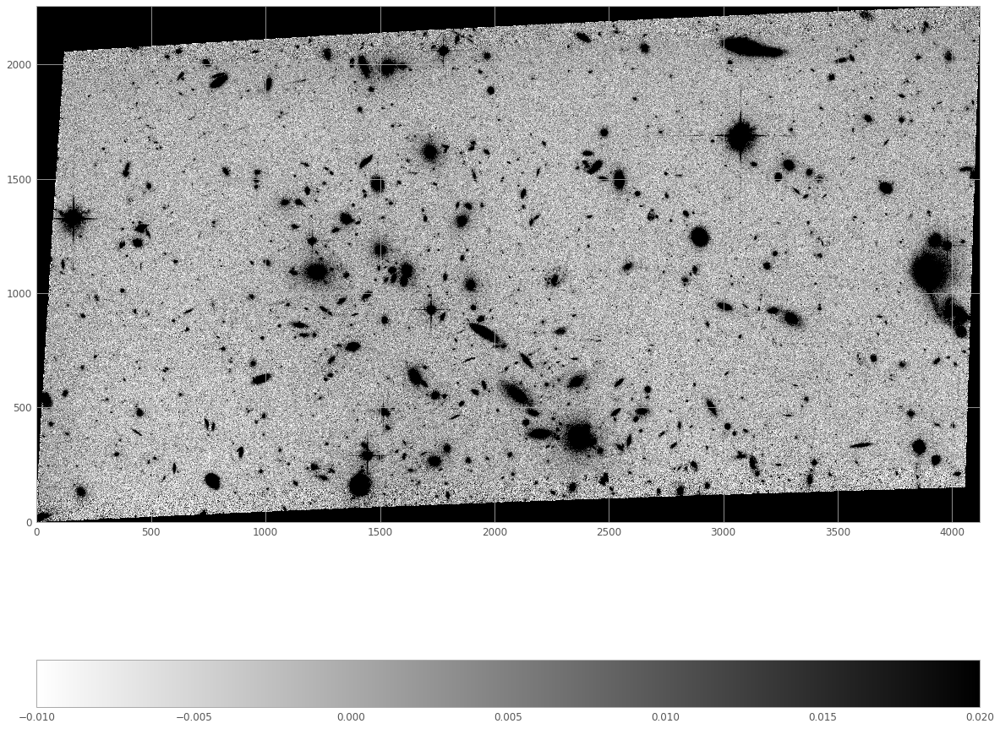

In [13]:
img = fits.getdata('manual_drc.fits', ext=1)

norm1 = ImageNormalize(img, vmin=-0.01, vmax=0.02, stretch=LinearStretch())
plt.figure(figsize=(20, 20))
plt.imshow(img, norm=norm1, cmap='gray_r', origin='lower')
plt.colorbar(orientation='horizontal')

## About this Notebook

    Author: R. Avila, STScI ACS Team  
    Updated: December 14, 2018